In [7]:
using StatsPlots
using LinearAlgebra
using Random
using Statistics
using Distributions
using Plots

In [8]:
function MHRW(energia,np,p0,δ=0.5,iterations=10000)
    
    
    #Muestras del algorimo
    samples = zeros(np,iterations)
    #Punto de partida
    ## Se escoge el punto inicial obtenido de invertir el operador A
    samples[:,1] = p0
    
    #Probabilidades
    probabilities = zeros(iterations)
    probabilities[1] = energia(samples[:,1])
    
    #Tasa de aceptación
    rateAlpha = 0
    
    # Algoritmo Metrópolis-Hastings
    for i in 1:iterations-1
        
        #Estado actual
        Xᵢ = samples[:,i]
        #Estado propuesto
        X₊ = rand(MvNormal(Xᵢ,δ*I))
        
        #π(Estado actual → Estado propuesto)
        pXᵢX₊ = energia(X₊) * pdf(MvNormal(Xᵢ,δ*I),X₊)
        #π(Estado propuesto → Estado actual)
        pX₊Xᵢ = energia(Xᵢ) * pdf(MvNormal(X₊,δ*I),Xᵢ)
        #Tasa de aceptacion α
        alpha = min(1, pXᵢX₊/pX₊Xᵢ)
    
        #Aceptación o rechazo del estado propuesto
        u = rand()    
        if u < alpha 				#Aceptación
            samples[:,i+1] = X₊
            probabilities[i+1] = energia(X₊)
            rateAlpha += 1
        else 						#Rechazo
            samples[:,i+1] = Xᵢ
            probabilities[i+1] = energia(Xᵢ)
        end
    end
    rateAlpha /= (iterations-1)
    MAP = samples[:,findmax(probabilities)[2]]
    CM = [mean(row) for row in eachrow(samples)]
    return samples, probabilities, MAP, CM, rateAlpha
end

MHRW (generic function with 3 methods)

In [9]:
function MCIntegration(s)
    n = length(s)
    integral = zeros(n)
    convergence = zeros(n-1)
    for i in 1:n
        integral[i] = mean(s[1:i])
    end
    for j in 2:n
        convergence[j-1] = abs(integral[j]-integral[j-1])
    end
    return convergence
end

MCIntegration (generic function with 1 method)

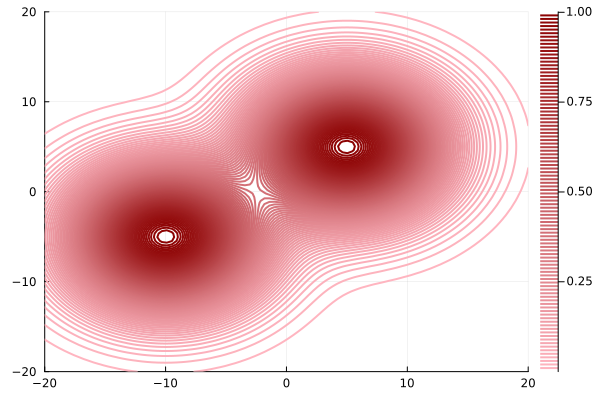

In [40]:
function energia1(p)
    x = p[1]
    y = p[2]
    a = 2*(x-5)^2+2*(y-5)^2
    b = 2*(x+10)^2+2*(y+5)^2 
    return exp(-a/100) + exp(-b/100)
end
ran = range(-20, 20, length=100)
contour1 = contour(ran, ran, [energia1((i, j)) for j in ran, i in ran], levels=100, linewidth=2, color=:reds)

In [47]:
samples1, probabilities1, Alpha1, MAP1, CM1 = MHRW(energia1,2,[20.0,-20.0],0.5,10000)

([20.0 19.885678014357232 … -13.157113869308835 -13.652794241751385; -20.0 -20.197686238280877 … -9.044669665192773 -9.17148288633295], [4.156856698011318e-8, 3.651984121308905e-8, 3.379952078422316e-8, 3.5322408204189264e-8, 3.5322408204189264e-8, 8.910630435481946e-8, 8.910630435481946e-8, 3.120360865741835e-7, 2.279931024383659e-7, 1.5726690022979107e-7  …  0.5146740471684477, 0.5048385761084172, 0.4080825124103355, 0.4095644255505523, 0.4095644255505523, 0.5320961144729777, 0.48567299901402716, 0.47991642485150043, 0.5906748616746398, 0.5407210028919598], [-9.918855088622808, -4.977541472085436], [-8.111168670028254, -4.138184212412787], 0.936993699369937)

In [43]:
function pointcloud(delta,iterations=10000)
    samples, probabilities, MAP, CM, Alpha = MHRW(energia1,2,[20.0,-20.0],delta,iterations)
    xhist = samples[1, :]
    yhist = samples[2, :]
    lim = 25
    ran = range(-lim, lim, length=100)
    sxy = contour(ran, ran, [energia1((i, j)) for j in ran, i in ran], levels=30, linewidth=2, color=:reds,xlim=(-lim,lim),ylim=(-lim,lim),
    colorbar=false)
    sxy = scatter!(xhist[:], yhist[:], markersize=1, title="", color="black", alpha=0.8,
        xlabel="", ylabel="", border=:box,xlim=(-lim,lim),ylim=(-lim,lim))
    hx = histogram(xhist,color="tomato",xlim=(-lim,lim),bins=30,yaxis=false,grid=false)
    hy = histogram(yhist, orientation=:horizontal,ylim=(-lim,lim),color="orangered",bins=30,xaxis=false,grid=false)
    p0 = Plots.Plot()
    cuadricula = grid(2,2, heights=(0.2,0.8), widths=(0.8,0.2))
    PP = plot(hx, p0, sxy, hy, legend=:none, layout=cuadricula,size=(800,600))
    return PP
end

pointcloud (generic function with 2 methods)

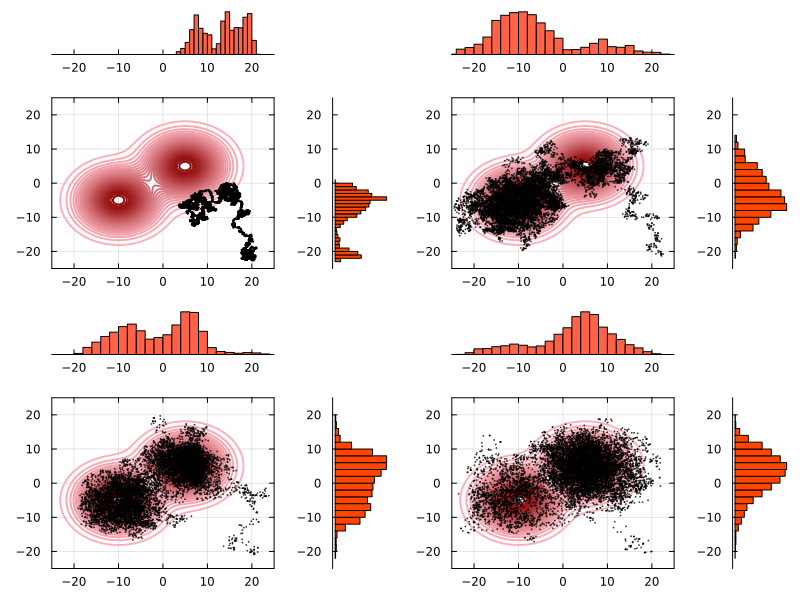

In [45]:
p11 = plot(pointcloud(0.01))
p12 = plot(pointcloud(0.25))
p21 = plot(pointcloud(0.5))
p22 = plot(pointcloud(1))

plot(p11,p12,p21,p22,layout=(2,2))


In [46]:
savefig("4_MHRW_variationofdelta.png")

"C:\\Users\\carlo\\4_MHRW_variationofdelta.png"